In [14]:
import numpy as np
import pandas as pd
import tensorflow as tf
import gensim
from keras import models,datasets,layers
from keras._tf_keras.keras.preprocessing.text import Tokenizer
from keras._tf_keras.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

In [15]:
csvData=pd.read_csv("dataset.csv",encoding="ISO-8859-1")
csvData["polarity of tweet\xa0"] = csvData["polarity of tweet\xa0"].replace(4, 1)
csvData.drop(columns=["id of the tweet","date of the tweet","query","user"], inplace=True)
csvData

,polarity of tweet,text of the tweet
0,0,is upset that he can't update his Facebook by ...
1,0,@Kenichan I dived many times for the ball. Man...
2,0,my whole body feels itchy and like its on fire
3,0,"@nationwideclass no, it's not behaving at all...."
4,0,@Kwesidei not the whole crew
...,...,...
1048567,1,My GrandMa is making Dinenr with my Mum
1048568,1,Mid-morning snack time... A bowl of cheese noo...
1048569,1,@ShaDeLa same here say it like from the Termi...
1048570,1,@DestinyHope92 im great thaanks wbuu?


In [16]:
#Removing all , @ 
def cleanCell(review):
    review=review.split(" ")
    cleanedReview=""
    for word in review:
        if word not in [","," ","!","#","%","*"]:
            if word and word[0]!="@":
                if word[-1] in [',','@','#','$','%','^','&','*',';','?','.','+','=']:
                    if word!="":
                        cleanedReview+=word[:-1]
                        cleanedReview+=" "
                else:
                    cleanedReview+=word
                    cleanedReview+=" "
    return cleanedReview

In [17]:
csvData["text of the tweet\xa0"]=csvData["text of the tweet\xa0"].apply(cleanCell)
csvData

,polarity of tweet,text of the tweet
0,0,is upset that he can't update his Facebook by ...
1,0,I dived many times for the ball Managed to sav...
2,0,my whole body feels itchy and like its on fire
3,0,no it's not behaving at all i'm mad why am i h...
4,0,not the whole crew
...,...,...
1048567,1,My GrandMa is making Dinenr with my Mum
1048568,1,Mid-morning snack time.. A bowl of cheese nood...
1048569,1,same here say it like from the Terminiator mov...
1048570,1,im great thaanks wbuu


In [18]:
reviews=csvData["text of the tweet\xa0"].apply(gensim.utils.simple_preprocess)
reviews

0          [is, upset, that, he, can, update, his, facebo...
1          [dived, many, times, for, the, ball, managed, ...
2          [my, whole, body, feels, itchy, and, like, its...
3          [no, it, not, behaving, at, all, mad, why, am,...
4                                    [not, the, whole, crew]
                                 ...                        
1048567     [my, grandma, is, making, dinenr, with, my, mum]
1048568    [mid, morning, snack, time, bowl, of, cheese, ...
1048569    [same, here, say, it, like, from, the, termini...
1048570                           [im, great, thaanks, wbuu]
1048571          [cant, wait, til, her, date, this, weekend]
Name: text of the tweet , Length: 1048572, dtype: object

In [19]:
gensimModel=gensim.models.Word2Vec(
    window=10,min_count=2,workers=8,vector_size=20
)

In [20]:
gensimModel.build_vocab(reviews,progress_per=2000)

In [21]:
gensimModel.train(reviews,total_examples=gensimModel.corpus_count,epochs=20)

(202982670, 253247200)

In [49]:
gensimModel.save("GensimVocabModel.h5")

In [22]:
sentiment=csvData["polarity of tweet\xa0"]
sentiment

0          0
1          0
2          0
3          0
4          0
          ..
1048567    1
1048568    1
1048569    1
1048570    1
1048571    1
Name: polarity of tweet , Length: 1048572, dtype: int64

In [23]:
def sentenceToVector(sentence):
    result=[]
    for word in sentence:
        if word in gensimModel.wv:
            embedding = gensimModel.wv[word]
            result.append(embedding)
        else:
            result.append(np.random.uniform(-0.25, 0.25, gensimModel.vector_size))
    return result

In [24]:
reviews=[sentenceToVector(sentence) for sentence in reviews]
reviews

[[array([ 3.9894884 , -0.9862173 , -2.662564  , -5.779507  ,  0.22624959,
          2.4668438 ,  0.17658348, -0.93188024, -4.972188  ,  1.7452065 ,
         -0.5227567 ,  2.1994638 , -0.3159141 , -0.16276765,  1.1523074 ,
         -4.823866  , -1.6255556 ,  2.5505576 ,  4.902531  ,  1.863456  ],
        dtype=float32),
  array([-3.418548  , -0.07247223,  6.332295  ,  0.256147  , -1.6343422 ,
          3.7416604 ,  0.49765706,  1.1462702 ,  6.432171  , -2.1425576 ,
          4.2916646 , -4.5984535 , -1.9111322 , -5.7469635 , -0.82525975,
         -2.5060093 ,  0.7937657 ,  0.8233081 ,  1.6986227 ,  1.334049  ],
        dtype=float32),
  array([ 5.642642  ,  4.2694306 ,  1.7384864 , -2.5662732 ,  0.0739817 ,
         -1.3486212 ,  3.936107  ,  1.1612546 ,  7.887502  , -0.72939384,
          0.13520464, -1.9935998 ,  0.5793775 ,  0.5365691 ,  1.4961568 ,
          0.49025187,  6.380366  , -3.8975816 ,  4.0106163 ,  0.21118031],
        dtype=float32),
  array([ 2.6186829 ,  3.441506  , 10

In [25]:
maxLen=max(len(x) for x in reviews)
reviews=pad_sequences(reviews,maxlen=maxLen,padding="post",dtype="float32")
reviews=np.array(reviews,dtype="float32")

In [26]:
reviews

array([[[ 3.98948836e+00, -9.86217320e-01, -2.66256404e+00, ...,
          2.55055761e+00,  4.90253115e+00,  1.86345601e+00],
        [-3.41854811e+00, -7.24722296e-02,  6.33229494e+00, ...,
          8.23308110e-01,  1.69862270e+00,  1.33404899e+00],
        [ 5.64264202e+00,  4.26943064e+00,  1.73848641e+00, ...,
         -3.89758158e+00,  4.01061630e+00,  2.11180314e-01],
        ...,
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[-1.36774018e-01, -2.52036572e-01, -6.91212267e-02, ...,
         -2.56716520e-01, -1.00360423e-01, -1.23905376e-01],
        [-2.82039404e+00,  4.06548858e-01,  2.63476777e+00, ...,
         -1.75238621e+00,  1.16425447e

In [27]:
reviews=[arr.flatten() for arr in reviews]
reviews

[array([ 3.98948836e+00, -9.86217320e-01, -2.66256404e+00, -5.77950716e+00,
         2.26249591e-01,  2.46684384e+00,  1.76583484e-01, -9.31880236e-01,
        -4.97218800e+00,  1.74520648e+00, -5.22756696e-01,  2.19946384e+00,
        -3.15914094e-01, -1.62767649e-01,  1.15230739e+00, -4.82386589e+00,
        -1.62555563e+00,  2.55055761e+00,  4.90253115e+00,  1.86345601e+00,
        -3.41854811e+00, -7.24722296e-02,  6.33229494e+00,  2.56146997e-01,
        -1.63434219e+00,  3.74166036e+00,  4.97657061e-01,  1.14627016e+00,
         6.43217087e+00, -2.14255762e+00,  4.29166460e+00, -4.59845352e+00,
        -1.91113222e+00, -5.74696350e+00, -8.25259745e-01, -2.50600934e+00,
         7.93765724e-01,  8.23308110e-01,  1.69862270e+00,  1.33404899e+00,
         5.64264202e+00,  4.26943064e+00,  1.73848641e+00, -2.56627321e+00,
         7.39817023e-02, -1.34862125e+00,  3.93610692e+00,  1.16125464e+00,
         7.88750219e+00, -7.29393840e-01,  1.35204643e-01, -1.99359977e+00,
         5.7

In [28]:
reviews=np.array(reviews)
reviews.shape

(1048572, 800)

In [29]:
ann=models.Sequential([
    layers.Dense(64,activation="relu",input_shape=(800,)),
    layers.Dense(32,activation="relu"),
    layers.Dense(1,activation="sigmoid")
])

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/layers/core/dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [30]:
ann.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
X_train, X_test, y_train, y_test = train_test_split(reviews, sentiment, test_size=0.2)


In [31]:
ann.fit(X_train, y_train, epochs=100 ,validation_split=0.2)

Epoch 1/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 14s 647us/step - accuracy: 0.7846 - loss: 0.4799 - val_accuracy: 0.8012 - val_loss: 0.4460
Epoch 2/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 13s 621us/step - accuracy: 0.8038 - loss: 0.4402 - val_accuracy: 0.8050 - val_loss: 0.4391
Epoch 3/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 13s 611us/step - accuracy: 0.8093 - loss: 0.4279 - val_accuracy: 0.8057 - val_loss: 0.4377
Epoch 4/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 13s 606us/step - accuracy: 0.8120 - loss: 0.4214 - val_accuracy: 0.8067 - val_loss: 0.4366
Epoch 5/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 13s 617us/step - accuracy: 0.8164 - loss: 0.4134 - val_accuracy: 0.8067 - val_loss: 0.4350
Epoch 6/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 13s 622us/step - accuracy: 0.8178 - loss: 0.4097 - val_accuracy: 0.8058 - val_loss: 0.4377
Epoch 7/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 14s 675us/step - accuracy: 0.8204 - loss: 0.4041 - val_accuracy: 0.8082 - val_loss: 0.4409
Epoch 8/100
20972/20972 ━━━━━━━━━━━━━━━━━━━━ 13s

In [32]:
def predictSentiment(sentence):
    sentence=gensim.utils.simple_preprocess(sentence)
    sentence=sentenceToVector(sentence)
    sentence=pad_sequences([sentence],maxlen=40,padding="post",dtype="float32")
    sentence=np.array(sentence,dtype="float32")
    sentence=sentence.flatten()
    sentence=np.array([sentence])
    result=ann.predict(sentence)[0][0]
    if result>.5:
        print("Positive: ",result)
    else:
        print("Negative: ",result)

In [43]:
predictSentiment("i am terrible")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Negative:  0.002569235


26215/26215 ━━━━━━━━━━━━━━━━━━━━ 8s 291us/step
[[0.07483018]
 [0.00607039]
 [0.06479845]
 ...
 [0.08052424]
 [0.26594833]
 [0.00040798]]


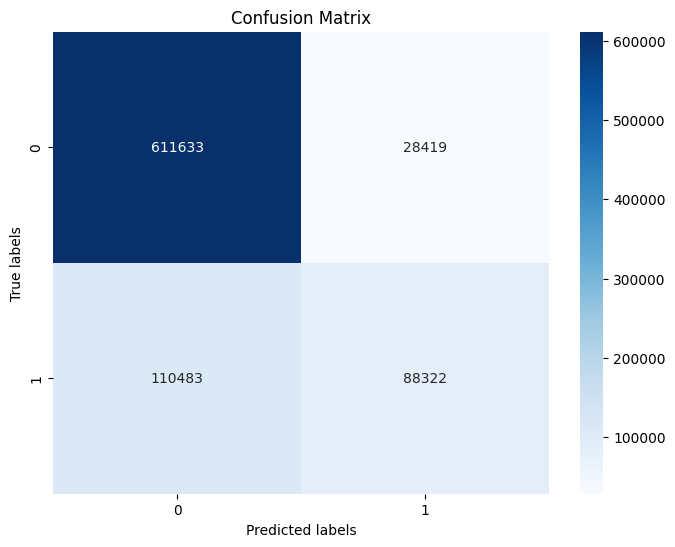

In [34]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have x_train and the model cnn

# Generate predictions
predictions = ann.predict(X_train)
print(predictions)

# Convert predictions to class labels (assuming binary classification)
predicted_labels = []
for x in predictions:
    if x[0]>.5:
        predicted_labels.append(1)
    else:
        predicted_labels.append(0)

# Assuming you have true labels for x_train
# Replace true_labels with your actual true labels
true_labels = y_train

# Create confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()